# 15-9. 프로젝트 : 다양한 OCR모델 비교하기

## Step 0. 환경설정 및 라이브러리 임포트

In [1]:
# ! mkdir -p ~/aiffel/ocr_python/data

In [2]:
import os
import io
import warnings
warnings.filterwarnings("ignore")
import cv2 
import keras_ocr
import pytesseract
from pytesseract import Output
from PIL import Image, ImageDraw
from glob import glob
from google.cloud import vision
import matplotlib.pyplot as plt
import matplotlib.image as img

print(keras_ocr.__version__)
print(pytesseract.__version__)
# pytesseract는 tesseract-ocr에 종속적입니다. 아래 명령어를 통해 설치해야 할 수도 있습니다.
# !sudo apt install tesseract-ocr

0.8.8
0.3.8


## Step1. 검증용 데이터셋 준비

#### 도서관에서 새로운 책을 구입했을때 도서목록에 쉽게 등록할 수 있도록 책 표지에서 필요한 정보를 읽어내는 성능을
#### 테스트 해 보겠다.   책 표지는 아마존 사이트에서 캡쳐하였으며 여러가지 글자체, 크기, 배경 및 기울여 쓰여진것, 
#### 수직으로 쓰여진것도 포함시켰다.

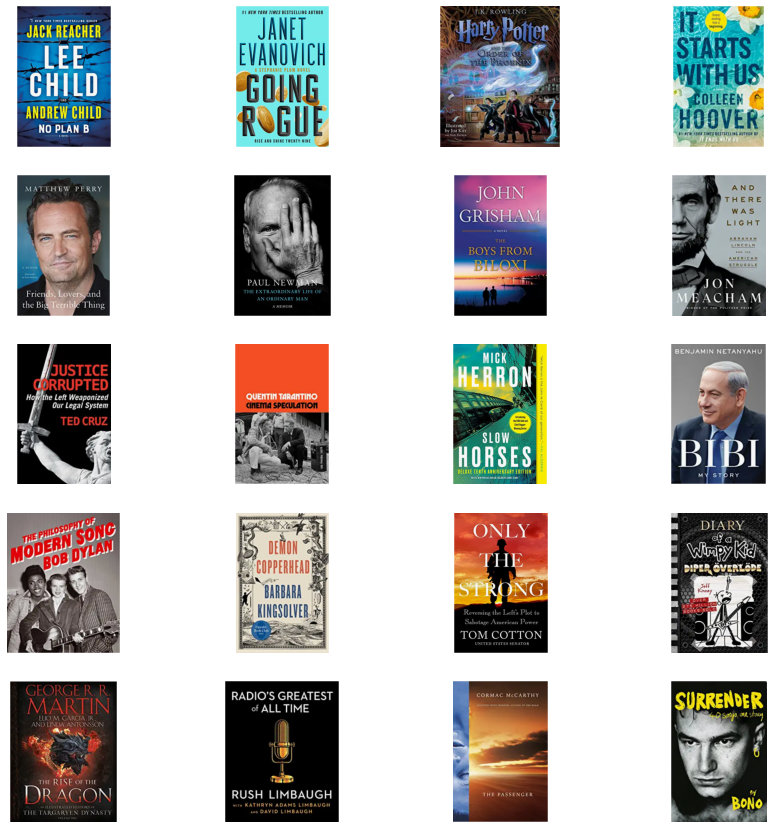

In [3]:
image_path = os.getenv('HOME') + '/aiffel/ocr_python/data/*.png'
image_path = glob(image_path)

plt.figure(figsize=(15, 15))
for idx, image in enumerate(image_path):
    plt.subplot(5, 4, idx+1)
    im=img.imread(image)
    plt.imshow(im)
    plt.axis('off')

## Step2. keras-ocr, Tesseract 및 Google OCR API로 테스트 진행

### 2-1. keras-OCR

In [4]:
! pip list | grep keras-ocr

keras-ocr                     0.8.8


In [5]:
# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [6]:
# 문자 검출 및 인식
images = [ keras_ocr.tools.read(im) for im in image_path]
prediction_groups = [pipeline.recognize([im]) for im in images]

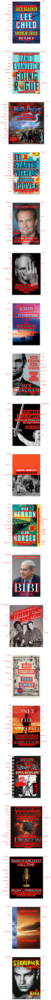

In [18]:
# 시각화 (결과 확인)
fig, axs = plt.subplots(nrows=len(images), figsize=(140, 210))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

### 2-2. Tesseract

In [8]:
# ! sudo apt install tesseract-ocr
# ! sudo apt install libtesseract-dev

In [9]:
! pip list | grep pytesseract

pytesseract                   0.3.8


In [10]:
# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

# 문자 검출 함수
def crop_word_regions(image_path, output_path):
    if not os.path.exists(output_path):
        os.mkdir(output_path)

    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)
    img = cv2.imread(image_path)
    
    recognized_data = pytesseract.image_to_data(image,
                                                lang='eng',  # 한국어라면 lang='kor'
                                                config=custom_oem_psm_config,
                                                output_type=Output.DICT)
    
    n_boxes = len(recognized_data['text'])
    for i in range(n_boxes):
        if int(recognized_data['conf'][i]) > 60:
            (x, y, w, h) = (recognized_data['left'][i], 
                            recognized_data['top'][i], 
                            recognized_data['width'][i], 
                            recognized_data['height'][i])
            img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    img_regn = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            cropped_image = image.crop((left,
                                        top,
                                        left+width,
                                        top+height))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    
    return cropped_image_path_list, img_regn

In [11]:
# 문자 인식 함수
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(image, 
                                                      lang='eng',  # 한국어라면 lang='kor'
                                                      config=custom_oem_psm_config,
                                                      output_type=Output.DICT)
        print(recognized_data['text'])

/aiffel/aiffel/ocr_python/data/15-18.png


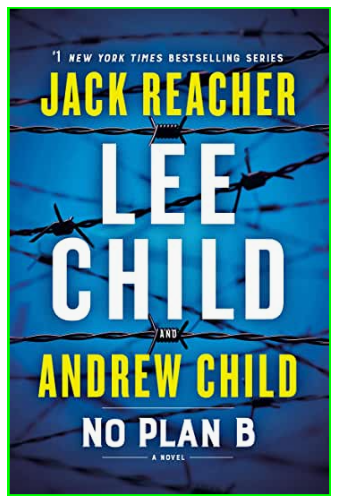



ate 73

Tur

/aetiv

7285

SEVIES

ay AH

ae a


wn

Mean

NO PLAN B



/aiffel/aiffel/ocr_python/data/15-17.png


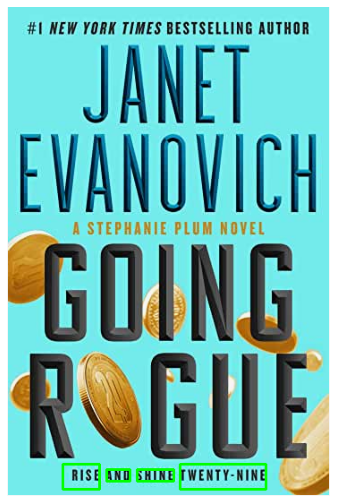

RISE

AN i)

SHINE

TWENTY-NINE

/aiffel/aiffel/ocr_python/data/15-06.png


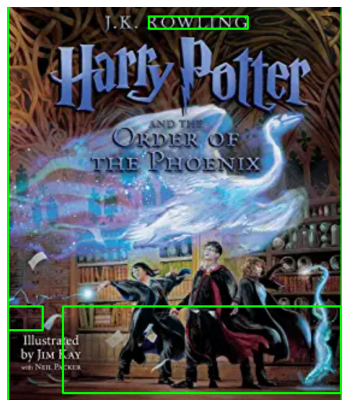

i.

RCOW LING,

|



UG

SRS eS fi

es

Sal

Via te



/aiffel/aiffel/ocr_python/data/15-01.png


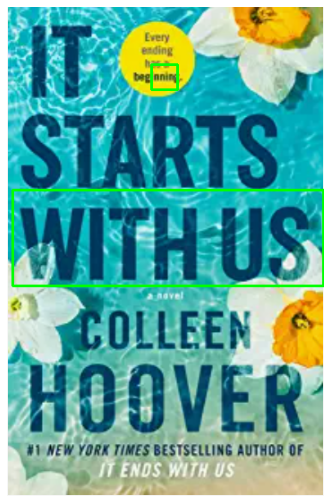

ni


 @OLLEEN

r

#7 1 YORK TIMES BESTSELLING -f OF :

/aiffel/aiffel/ocr_python/data/15-02.png


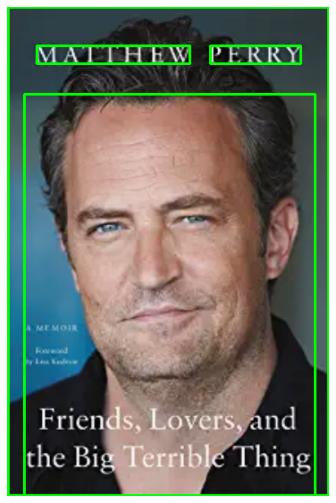



MAIL |L_HkW

PERRY

J



/aiffel/aiffel/ocr_python/data/15-20.png


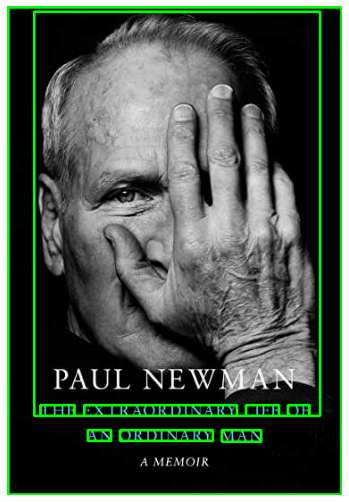




seeet

We SRS: TSR api nee. od

Bint

e735

PN

Ol aere. ee ee

VIAN

a eon.



/aiffel/aiffel/ocr_python/data/15-08.png


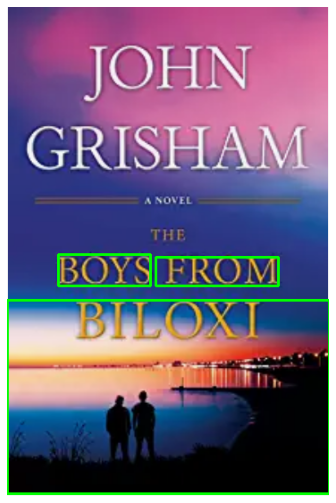

BOYS

KROM

DA =

Nel



/aiffel/aiffel/ocr_python/data/15-10.png


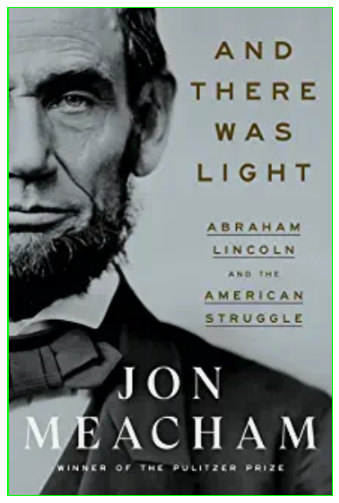

| , |

/aiffel/aiffel/ocr_python/data/15-12.png


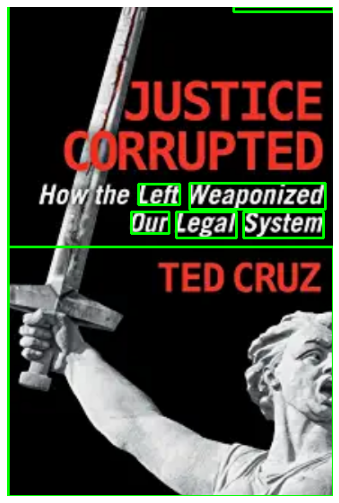


|

1

Howithe

{ eff

Weaponized

Our

aT)

System


NS

/aiffel/aiffel/ocr_python/data/15-16.png


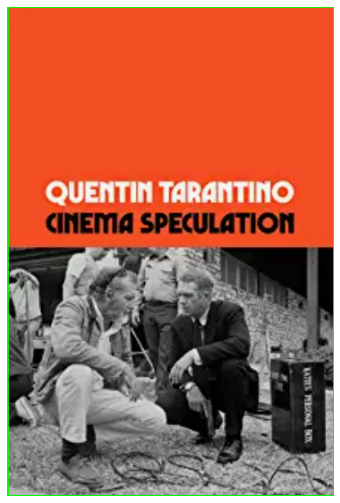


/aiffel/aiffel/ocr_python/data/15-03.png


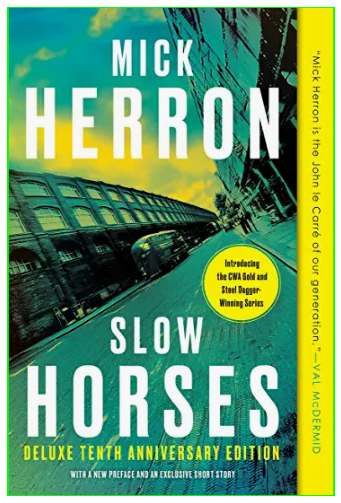



/aiffel/aiffel/ocr_python/data/15-13.png


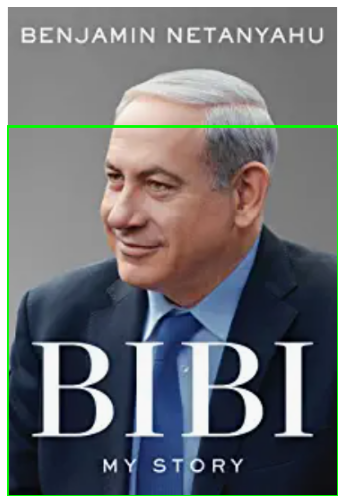


/aiffel/aiffel/ocr_python/data/15-14.png


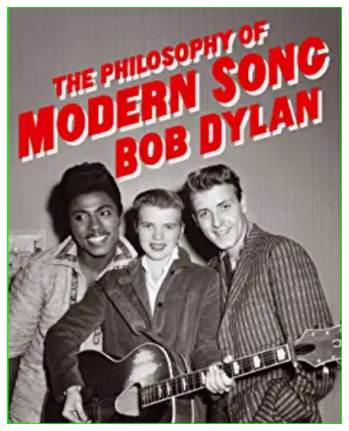


/aiffel/aiffel/ocr_python/data/15-11.png


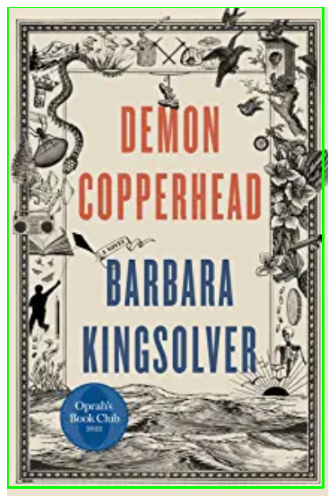


/aiffel/aiffel/ocr_python/data/15-19.png


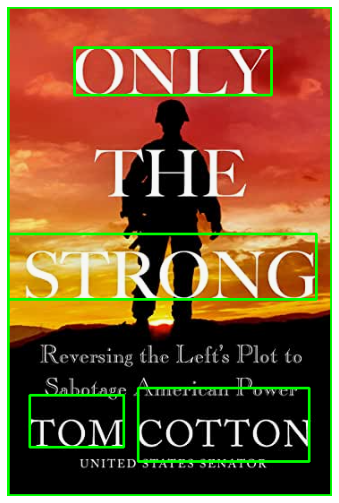

ne

OONTLY

gah


Sabotag

A

_

&

ae

COTTON

Cis Bie oe,

ay

‘wie

eh

Baer



ne

/aiffel/aiffel/ocr_python/data/15-05.png


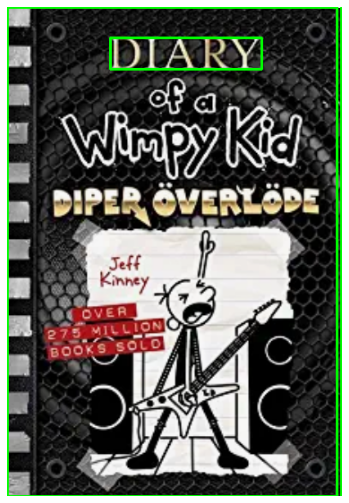

LDLA RY.

Of}

oe

Malia ae

a ae

oA


/aiffel/aiffel/ocr_python/data/15-09.png


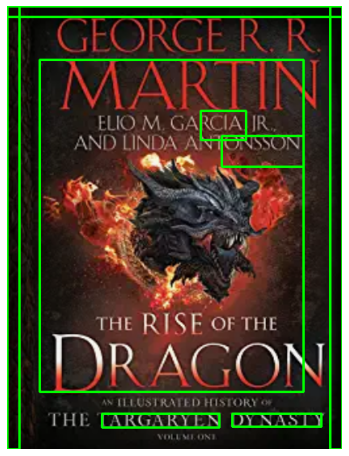

cc LL a eee ee


VV

Peale


Me i

RCIA.

AM

Daves

| 5

ON SO

eae

Se Lee eee

d|

By

a) a

Beee

Bay cere. e oe

DeacsAYya


/aiffel/aiffel/ocr_python/data/15-04.png


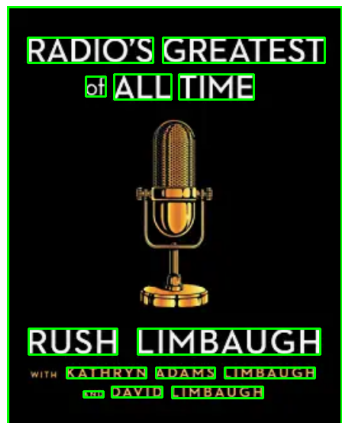

Tn


RADIO'S

Cia Vial

ot

Yan

TIME

"Gh.

| IMBAUGH

sae

2:28 ee

ADAMS

Bive-F-aence.

7 re

DAVID

i_iIMBAUGH


/aiffel/aiffel/ocr_python/data/15-15.png


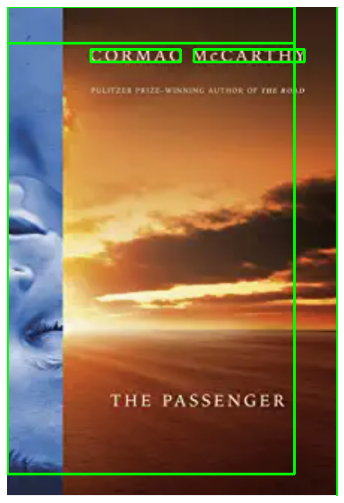

C—O ee

7 | , :

(ORMAC

McCARTIHY


/aiffel/aiffel/ocr_python/data/15-07.png


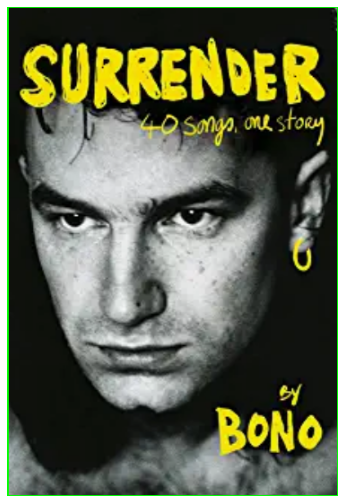

7 IN



In [12]:
output_path = os.getenv('HOME')+'/aiffel/ocr_python/output/'

for i in range(len(image_path)):
    print(image_path[i])
    cropped_image_path_list, img_regn = crop_word_regions(image_path[i], output_path)
    plt.figure(figsize=(6,9))
    plt.imshow(img_regn)
    plt.axis('off')
    plt.show()
    
    recognize_images(cropped_image_path_list)

### 2-3. Google OCR API

In [13]:
# ! pip install --upgrade google-api-python-client
# ! pip install google-cloud-vision

In [14]:
# Detects text in the file
def detect_text(path):
    text_list, bounds = [], []
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations

    for text in texts:
        text_list.append(text.description.replace('\n',''))
        vertices = text.bounding_poly
        bounds.append(vertices)

    vertices = (['({},{})'.format(vertex.x, vertex.y)
                for vertex in text.bounding_poly.vertices])

    if response.error.message:
        raise Exception('{}\nFor more info on error messages, check: '
                        'https://cloud.google.com/apis/design/errors'.format(response.error.message))
        
    return text_list, bounds

In [15]:
# Draw a border around the image using the hints in the vector list
def draw_boxes(image, bounds, color):
    draw = ImageDraw.Draw(image)

    for bound in bounds:
        draw.polygon([
            bound.vertices[0].x, bound.vertices[0].y,
            bound.vertices[1].x, bound.vertices[1].y,
            bound.vertices[2].x, bound.vertices[2].y,
            bound.vertices[3].x, bound.vertices[3].y], None, color)
    return image

total 8448
-rw-r--r-- 1 root root 8201517 Nov  7 02:51  Ex15-OCR_Python.ipynb
-rw-r--r-- 1 root root  446268 Nov  6 11:41 'Ex15-OCR_Python - Study.ipynb'

/aiffel/aiffel/ocr_python/data/15-18.png


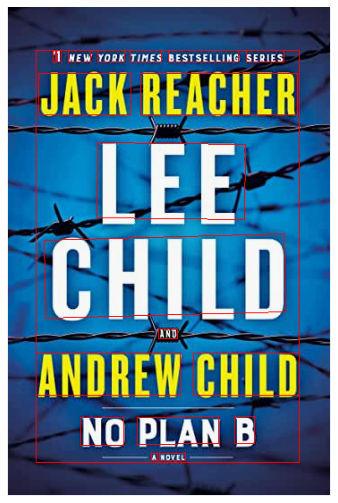

["'1 NEW YORK TIMES BESTSELLING SERIESJACK REACHERLEECHILDANDANDREW CHILDNO PLAN BA NOVEL", "'", '1', 'NEW', 'YORK', 'TIMES', 'BESTSELLING', 'SERIES', 'JACK', 'REACHER', 'LEE', 'CHILD', 'AND', 'ANDREW', 'CHILD', 'NO', 'PLAN', 'B', 'A', 'NOVEL']

/aiffel/aiffel/ocr_python/data/15-17.png


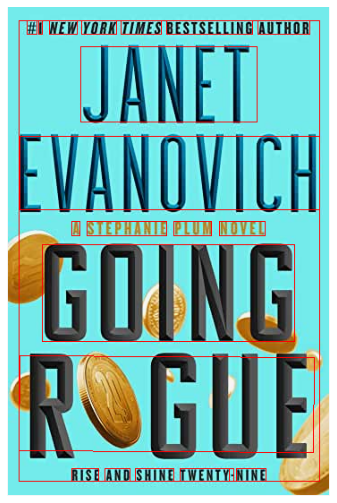

['#1 NEW YORK TIMES BESTSELLING AUTHORJANETEVANOVICHA STEPHANIE PLUM NOVELGOINGROGUERISE AND SHINE TWENTY-NINE', '#', '1', 'NEW', 'YORK', 'TIMES', 'BESTSELLING', 'AUTHOR', 'JANET', 'EVANOVICH', 'A', 'STEPHANIE', 'PLUM', 'NOVEL', 'GOING', 'ROGUE', 'RISE', 'AND', 'SHINE', 'TWENTY', '-', 'NINE']

/aiffel/aiffel/ocr_python/data/15-06.png


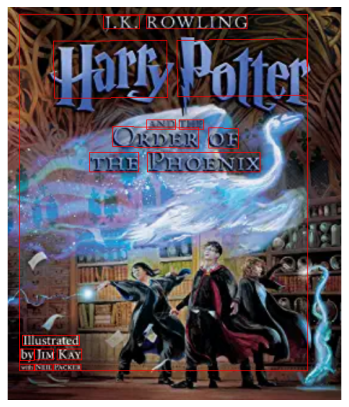

['J.K. ROWLINGHarry PotterIllustratedby JIM KAYwith NEIL PACKERAND THEORDER OFTHE PHOENIX', 'J.K.', 'ROWLING', 'Harry', 'Potter', 'Illustrated', 'by', 'JIM', 'KAY', 'with', 'NEIL', 'PACKER', 'AND', 'THE', 'ORDER', 'OF', 'THE', 'PHOENIX']

/aiffel/aiffel/ocr_python/data/15-01.png


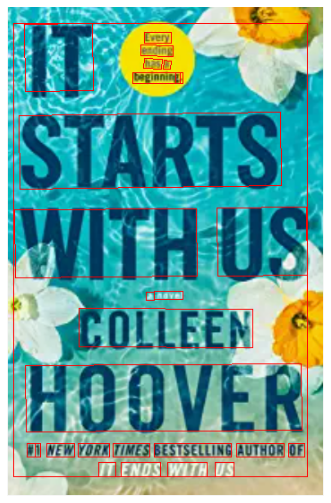

['ITEveryendinghas abeginning.STARTSWITH USa novelCOLLEENHOOVER#1 NEW YORK TIMES BESTSELLING AUTHOR OFIT ENDS WITH US', 'IT', 'Every', 'ending', 'has', 'a', 'beginning', '.', 'STARTS', 'WITH', 'US', 'a', 'novel', 'COLLEEN', 'HOOVER', '#', '1', 'NEW', 'YORK', 'TIMES', 'BESTSELLING', 'AUTHOR', 'OF', 'IT', 'ENDS', 'WITH', 'US']

/aiffel/aiffel/ocr_python/data/15-02.png


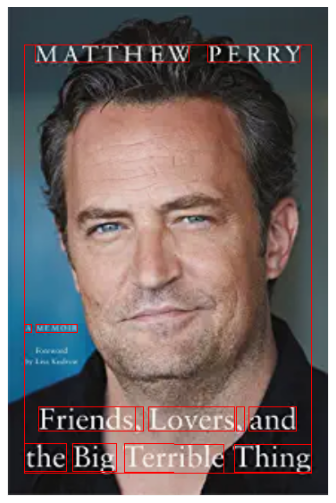

['MATTHEW PERRYA MEMOIRFriends, Lovers, andthe Big Terrible Thing', 'MATTHEW', 'PERRY', 'A', 'MEMOIR', 'Friends', ',', 'Lovers', ',', 'and', 'the', 'Big', 'Terrible', 'Thing']

/aiffel/aiffel/ocr_python/data/15-20.png


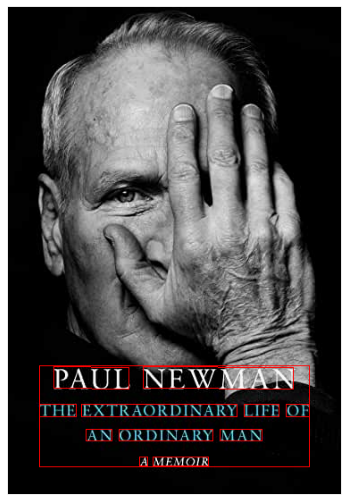

['PAUL NEWMANTHE EXTRAORDINARY LIFE OFAN ORDINARY MANA MEMOIR', 'PAUL', 'NEWMAN', 'THE', 'EXTRAORDINARY', 'LIFE', 'OF', 'AN', 'ORDINARY', 'MAN', 'A', 'MEMOIR']

/aiffel/aiffel/ocr_python/data/15-08.png


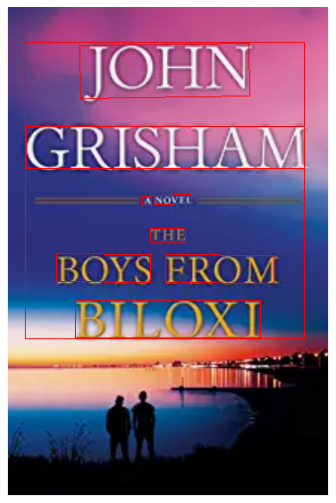

['JOHNGRISHAMA NOVELTHEBOYS FROMBILOXI', 'JOHN', 'GRISHAM', 'A', 'NOVEL', 'THE', 'BOYS', 'FROM', 'BILOXI']

/aiffel/aiffel/ocr_python/data/15-10.png


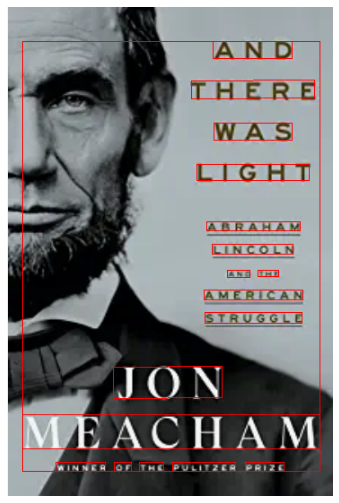

['ANDTHEREWASLIGHTABRAHAMLINCOLNAND THEAMERICANSTRUGGLEJONMEACHAMWINNER OF THE PULITZER PRIZE', 'AND', 'THERE', 'WAS', 'LIGHT', 'ABRAHAM', 'LINCOLN', 'AND', 'THE', 'AMERICAN', 'STRUGGLE', 'JON', 'MEACHAM', 'WINNER', 'OF', 'THE', 'PULITZER', 'PRIZE']

/aiffel/aiffel/ocr_python/data/15-12.png


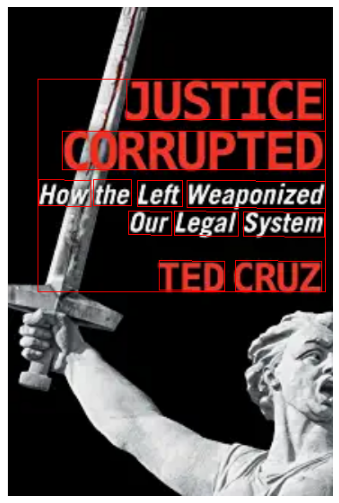

['JUSTICECORRUPTEDHow the Left WeaponizedOur Legal SystemTED CRUZ', 'JUSTICE', 'CORRUPTED', 'How', 'the', 'Left', 'Weaponized', 'Our', 'Legal', 'System', 'TED', 'CRUZ']

/aiffel/aiffel/ocr_python/data/15-16.png


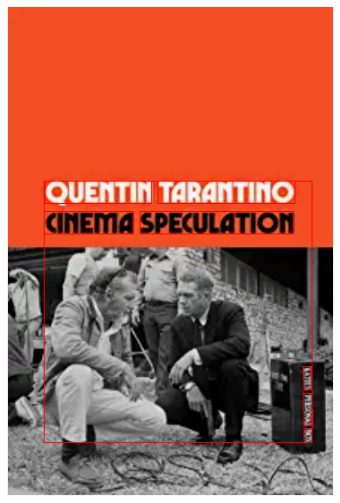

['QUENTIN TARANTINOCINEMA SPECULATIONKATIES PERSONAL BOX', 'QUENTIN', 'TARANTINO', 'CINEMA', 'SPECULATION', 'KATIES', 'PERSONAL', 'BOX']

/aiffel/aiffel/ocr_python/data/15-03.png


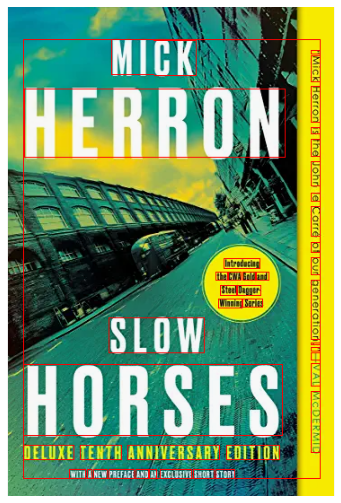

['MICKHERRONIntroducingthe CWA Gold andSteel DaggerWinning SeriesSLOWHORSESDELUXE TENTH ANNIVERSARY EDITIONWITH A NEW PREFACE AND AN EXCLUSIVE SHORT STORY"Mick Herron is the John le Carré of our generation."-VAL MCDERMID', 'MICK', 'HERRON', 'Introducing', 'the', 'CWA', 'Gold', 'and', 'Steel', 'Dagger', 'Winning', 'Series', 'SLOW', 'HORSES', 'DELUXE', 'TENTH', 'ANNIVERSARY', 'EDITION', 'WITH', 'A', 'NEW', 'PREFACE', 'AND', 'AN', 'EXCLUSIVE', 'SHORT', 'STORY', '"', 'Mick', 'Herron', 'is', 'the', 'John', 'le', 'Carré', 'of', 'our', 'generation', '.', '"', '-', 'VAL', 'MCDERMID']

/aiffel/aiffel/ocr_python/data/15-13.png


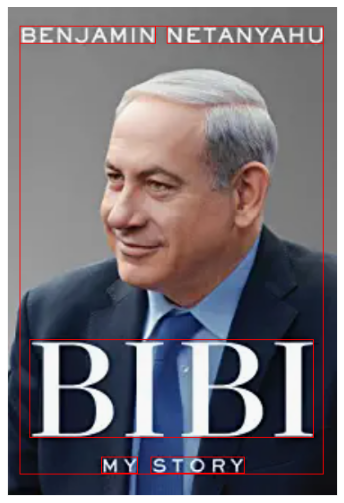

['BENJAMIN NETANYAHUBIBIMY STORY', 'BENJAMIN', 'NETANYAHU', 'BIBI', 'MY', 'STORY']

/aiffel/aiffel/ocr_python/data/15-14.png


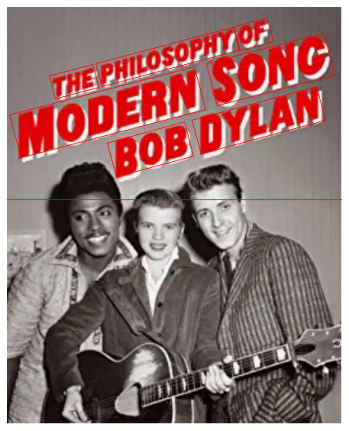

['THE PHILOSOPHY OFMODERN SONCBOB DYLAN', 'THE', 'PHILOSOPHY', 'OF', 'MODERN', 'SONC', 'BOB', 'DYLAN']

/aiffel/aiffel/ocr_python/data/15-11.png


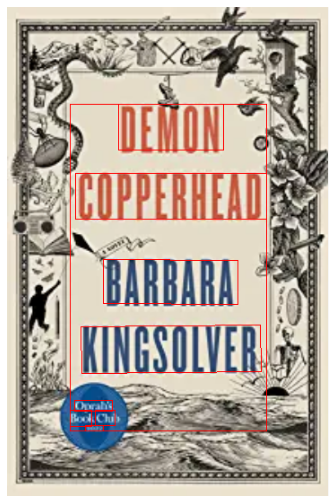

['DEMONCOPPERHEADBARBARAKINGSOLVEROprahisBook Chul3022', 'DEMON', 'COPPERHEAD', 'BARBARA', 'KINGSOLVER', 'Oprahis', 'Book', 'Chul', '3022']

/aiffel/aiffel/ocr_python/data/15-19.png


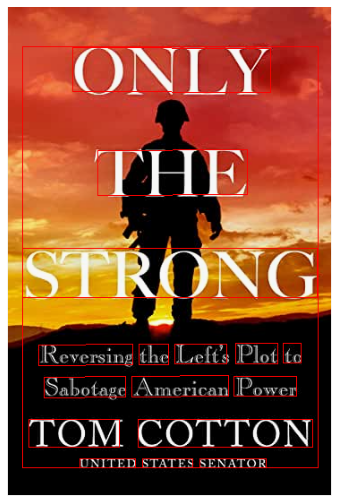

["ONLYTHESTRONGReversing the Left's Plot toSabotage American PowerTOM COTTONUNITED STATES SENATOR", 'ONLY', 'THE', 'STRONG', 'Reversing', 'the', "Left's", 'Plot', 'to', 'Sabotage', 'American', 'Power', 'TOM', 'COTTON', 'UNITED', 'STATES', 'SENATOR']

/aiffel/aiffel/ocr_python/data/15-05.png


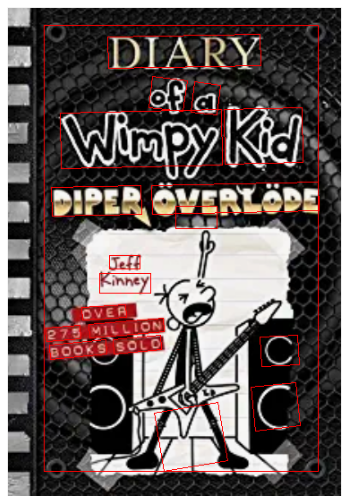

['DIARYof aWimpy KidDIPER ÖVERLÖDEYHJeffKinneyOVER275 MILLIONBOOKS SOLD24CC', 'DIARY', 'of', 'a', 'Wimpy', 'Kid', 'DIPER', 'ÖVERLÖDE', 'YH', 'Jeff', 'Kinney', 'OVER', '275', 'MILLION', 'BOOKS', 'SOLD', '24', 'C', 'C']

/aiffel/aiffel/ocr_python/data/15-09.png


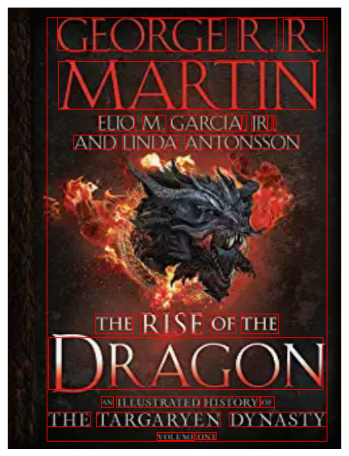

['GEORGE R. R.MARTINELIO M. GARCIA, JR.,AND LINDA ANTONSSONTHE RISE OF THEDRAGONAN ILLUSTRATED HISTORY OFTHE TARGARYEN DYNASTYVOLUME ONE', 'GEORGE', 'R.', 'R.', 'MARTIN', 'ELIO', 'M.', 'GARCIA', ',', 'JR', '.', ',', 'AND', 'LINDA', 'ANTONSSON', 'THE', 'RISE', 'OF', 'THE', 'DRAGON', 'AN', 'ILLUSTRATED', 'HISTORY', 'OF', 'THE', 'TARGARYEN', 'DYNASTY', 'VOLUME', 'ONE']

/aiffel/aiffel/ocr_python/data/15-04.png


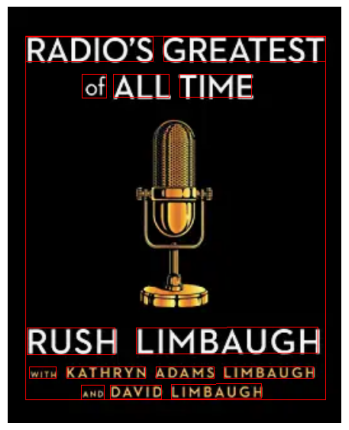

["RADIO'S GREATESTof ALL TIMERUSH LIMBAUGHWITH KATHRYN ADAMS LIMBAUGHAND DAVID LIMBAUGH", "RADIO'S", 'GREATEST', 'of', 'ALL', 'TIME', 'RUSH', 'LIMBAUGH', 'WITH', 'KATHRYN', 'ADAMS', 'LIMBAUGH', 'AND', 'DAVID', 'LIMBAUGH']

/aiffel/aiffel/ocr_python/data/15-15.png


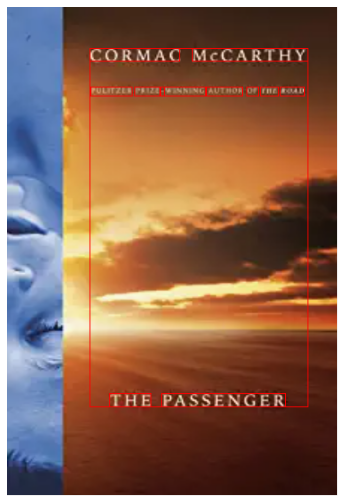

['CORMAC MCCARTHYPULITZER PRIZE-WINNING AUTHOR OF THE ROADTHE PASSENGER', 'CORMAC', 'MCCARTHY', 'PULITZER', 'PRIZE', '-', 'WINNING', 'AUTHOR', 'OF', 'THE', 'ROAD', 'THE', 'PASSENGER']

/aiffel/aiffel/ocr_python/data/15-07.png


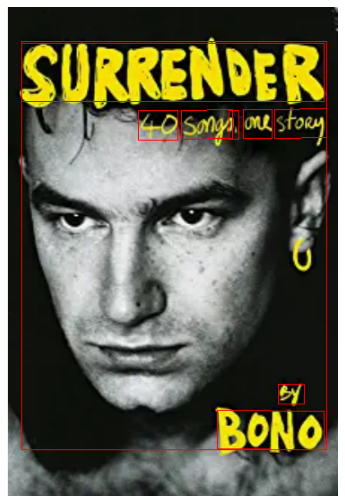

['SURRENDER40 Songs, one storyByBONO', 'SURRENDER', '40', 'Songs', ',', 'one', 'story', 'By', 'BONO']


In [16]:
# 로컬 환경에서는 다운받은 인증키 경로가 정확하게 지정되어 있어야 합니다. 
# 클라우드 환경에서는 무시해도 좋습니다
! ls -l $GOOGLE_APPLICATION_CREDENTIALS

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

for i in range(len(image_path)):
    print()
    print(image_path[i])
    text_list, bounds = detect_text(image_path[i])
    image = Image.open(image_path[i])
    image_regn = draw_boxes(image, bounds, 'red')
    plt.figure(figsize=(6, 9))
    plt.imshow(image_regn)
    plt.axis('off')
    plt.show()
    print(text_list)

## Step3. 테스트 결과 정리

#### 위 3가지 OCR 모델을 테스트 하면서 책 표지 이미지에 Text region이 검출된 상태를 보여주었고 또한 text가 제대로 
#### 인식되었는지 확인할 수 있도록 text를 표기하였다.

## Step4. 결과 분석과 결론 제시

### 1. 서비스의 목적과 내용
#### 도서관에서 새로운 서적을 구입하였을 때 책 표지를 스캔한 이미지로 책의 제목, 저자등을 추출하여 소장 도서목록에 
#### 쉽게 등록할 수 있는 서비스를 구현하고자 한다.    이렇게 하면 사서가 일일히 key-in하는 수고를 줄일 수 있다.
#### 물론 읽어낸 문자를 책 제목, 저자 등 필요한 정보로 분류하고 Excel등의 table에 정리하는 기능도 필요하지만 
#### 여기서는 OCR 기능만 평가하겠다.
### 2. 평가 기준
- 이미지상의 모든 text 부분을 빠짐없이 검출 하였는가.
- 글자의 크기, 글자체, 기울어지거나 수직으로 쓰여진 글자등을 모두 검출 하였는가.
- 글자를 얼마나 정확히 인식하는가.

### 3. 테스트 결과 분석 및 가장 나은 모델 선정
#### [keras-OCR]
- 일부 누락된 글자가 있으나 거의 모든 글자가 검출 되었다.
- 글자의 크기, 전혀 다른 글자체, 기울어지거나 수직으로 쓰여진 글자등을 모두 검출 하였다. 그러나 글자가 아닌부분을 글자로 검출한 부분도 있다.
- 대부분 글자를 정확하게 인식하였으나 글자체가 다른경우 잘못 인식하는경우도 있고 수직으로 쓰여진 경우 전혀 단어로 인식하지 못했다.

#### [Tesseract]
- 상당히 많은 부분에서 글자를 인식하지 못했고 이미지 전체를 하나로 인식한 경우도 많았다.
- 특이한 글자체, 기울어지거나 수직으로 쓰여진 단어는 전혀 인식하지 못했다.
- 그나마 검출한 문자도 제대로 인식된것이 몇개 안되며 평범한 인쇄체도 인식하지 못하고 있다.

#### [Google OCR API]
- 한개 이미지의 매우 작고 흐릿한 단어 2개를 제외한 모든 문자를 검출 하였다.
- 글자의 크기, 글자체, 기울어지거나 수직으로 쓰여진 글자등을 모두 검출하였다.
- 검출한 모든 글자를 정확하게 인식하였다. 기울어진 단어는 물론 수직으로 쓰여진 단어도 정확하게 인식하였으며 특히 위에서 두번째 표지의 "ROGUE"에서 "O"자가 비스듬한 동전으로 표기되었음에도 정확하게 "ROGUE"라고 인식한 점이 놀라웠다.

#### [모델선정]
3가지 평가기준의 모든면에서 가장 우수한 Google OCR API를 도서목록 작성서비스용 OCR 모델로 선정한다.

## 회고
### 이번 프로젝트에서 어려웠던 점

keras-OCR은 쟈체적으로 이미지에 검출된 문자영역을 표기하나 Google OCR API는 이미지에 검출된 문자에 사각 box표기를 하려니 어려웠다. Googling을 통해 겨우 해결했다. 

### 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점

이번 프로젝트는 인공지능을 학습시키는것이 아니고 기 개발된 모델을 비교평가하는것으로 인공지능 지식적인면에서는 크게 배울것은 없었다. Google OCR API 성능이 대단하다는것을 알게 되었다.

### 루브릭 평가 지표를 맞추기 위해 시도한 것들

1. 어떤 서비스에 OCR을 적용해야할지 고민을 많이 하였다. 주민등록증 등 신분증 인식이 좋아보였으나 이미지를 구할 수 없을것으로 생각되어 포기하였다.
2. 시각화를 하기 위하여 많은 노력을 하였다.

### 만약에 루브릭 평가 관련 지표를 달성 하지 못했을 때, 이유에 관한 추정

어느정도 달성했다고 생각된다.

### 자기 다짐

이미지에서의 글자 추출은 자율주행에서의 교통표지판 인식 등 많은 분야에서 활용성이 높은 분야라고 생각된다. 오픈소스 라이브러리인 Tesseract 소스를 구하여 공부해 보겠다.